In [133]:
import numpy as np
import pandas as pd
import math
import matplotlib.pyplot as plt
from numpy import linalg as linalg
import scipy as scipy
import seaborn as sns
import bql
bq = bql.Service()

# global constants (CHANGE ME ONLY)

In [134]:
startdate = '-3M'
enddate = '0D'
pct_chg_items = bq.func.pct_diff(bq.data.px_last(dates=bq.func.range(startdate, enddate), fill='prev')) #get request
str_rep = "PCT_DIFF(PX_LAST(fill='prev',dates=RANGE(" + startdate +"," + enddate +")))"
CEF_TCK = 'CEM US Equity'
TOPNUM = 3
WINDOW = 12
str_rep = "PCT_DIFF(PX_LAST(fill='prev',dates=RANGE(" + startdate + "," + enddate +")))"
plt.rcParams.update({'font.size': 16})

lams = [0, 0.00001, 0.0001, 0.001, 0.002, 0.01, 0.02, 0.03, 0.1, 0.2, 0.3, .7, 1, 1.5, 3]
n_splits = 10

# universal helper objects (RUN ONLY ONCE PER KERNEL)

In [135]:
def get_members(univ, display = True):
    """
    @returns: list of tickers of assets in fund
    """
    req = bql.Request(univ, bq.data.id()['value'])
    res = bq.execute(req)
    if display:
        print(res[0].df()['ID().VALUE'])
    return res[0].df().values.T[0].tolist()

In [136]:
def get_pct_chg(ticker):
    """
    @returns: DATAFRAME of numpy array (n x 1) of daily % change price of input ticker (n = # of datapts)
    """
    req = bql.Request(ticker, pct_chg_items)
    res = bq.execute(req)
    data = res[0].df().fillna(method="ffill").fillna(method="bfill")
    return data

In [137]:
def all_changes(ticker_list, dfdict, correct_len, plot_data = False):
    """
    @returns DICT, modifies dictionary with %chg data for each ticker in asset
    """
    if plot_data: # set plot display settings
        plt.rcParams.update({'font.size': 4})
        x = math.ceil(len(ticker_list)**.5)
        i=1
        plt.figure(figsize=(x*2,x*2))
    
    for tck in ticker_list:
        df = get_pct_chg(tck)
        pct_chg = df[str_rep].values
        if pct_chg.shape[0] != correct_len:
            continue
        if plot_data:
            plt.subplot(x,x,i)
            i+=1
            plt.plot(df['DATE'], pct_chg)
            plt.tick_params(axis='x', rotation=70)
            plt.title(tck)
        dfdict[tck] = pct_chg
        
    if plot_data: #reset plot display settings
        plt.show()
        plt.rcParams.update({'font.size': 12})
    return dfdict

In [138]:
def corr_matrix(df):
    """ 
    @returns DF correlation matrix from input data dataframe (sorted in max -> min order)
    """
    corr = df.corr().abs()
    corr.fillna(0, inplace= True)
    return corr.sort_values(by=CEF_TCK,ascending=False)

In [139]:
def corr_list_sorted(sorted_corr_df):
    """
    @returns sorted max->min of correlations with fund
    """
    return sorted_corr_df.values[0].tolist()

In [140]:
def get_top_corr(sorted_corr_df, num):
    """
    @returns DICT of top (num) correlated assets in fund
    """
    top = {}
    i=0
    for row in sorted_corr_df.itertuples():
        if (row.Index == CEF_TCK):
            continue
        i+=1
        top[row.Index] = row[1] #CEF column
        if i==num: return top

In [141]:
def get_data(tup):
    """
    @returns np.array of price changes given tuple of the form: (ticker string, correlation value, dictionary ticker is in)
    """
    dic = tup[2]
    tck = tup[0]
    return dic[tck]

**Helper functions for Linear Regression**

In [142]:
def lin_reg(X, Y, lam=None):
    d, n = X.shape #Y = (n,1)
    
    aug = np.array([1]*n).T # (n,)
    Xaug = np.vstack((X, aug)) # (topnum+1, n)
    
    addon = 0
    if lam is not None:
        addon = n*lam*np.identity(d+1)
    a = np.linalg.inv( np.dot(Xaug, Xaug.T)  + addon)
    b = np.dot(Xaug, Y)
    th = np.dot(a,b) #d+1 x1
    return th[:d], th[d][0]

In [143]:
def mse(X_test, Y_test, th, th0, lam):
    Y_hat = th.T@X_test + th_0 # 1 x n
    return  np.mean((Y_test.T-Y_hat)**2) + lam*(np.linalg.norm(th))

In [144]:
def make_splits(X, Y, n_splits):
    """
    X: (d, n)
    Y: (n, 1)
    """
    d, n = X.shape
    subsetsize = math.ceil(n/n_splits)
    splits = []
    for i in range(n_splits):
        X_test = X[: , i*subsetsize : (i+1)*subsetsize] # (d, s)
        Y_test = Y[i*subsetsize : (i+1)*subsetsize, :] # (s, 1)
        
        X_sub = np.concatenate((X[:,:i*subsetsize], X[:,(i+1)*subsetsize:]), axis=1) #(d, n-s)
        Y_sub = np.concatenate((Y[:i*subsetsize,:], Y[(i+1)*subsetsize:,:]), axis=0) #(n-s, 1)
        splits.append((X_sub, Y_sub, X_test, Y_test))
    return splits

In [145]:
def cross_validate(X, Y, n_splits, lam,
                   learning_algorithm, loss_function):
    splits = make_splits(X, Y, n_splits)
    total_e = 0
    for i in range(n_splits):
        X_subset = splits[i][0]
        Y_subset = splits[i][1]
        X_test = splits[i][2]
        Y_test = splits[i][3]
        th, th0 = learning_algorithm(X_subset, Y_subset, lam)
        l = loss_function(X_test, Y_test, th, th0, lam)
        total_e += l
    return total_e/n_splits

# Run correlations internally on Fund

**get list of holdings in CEF**

In [146]:
cef_list = get_members(bq.univ.holdings(CEF_TCK))

ID
MPLX US Equity      MPLX US Equity
ET US Equity          ET US Equity
EPD US Equity        EPD US Equity
WES US Equity        WES US Equity
MMP US Equity        MMP US Equity
TRGP US Equity      TRGP US Equity
WMB US Equity        WMB US Equity
PAA US Equity        PAA US Equity
PAGP US Equity      PAGP US Equity
OKE US Equity        OKE US Equity
HESM US Equity      HESM US Equity
AM US Equity          AM US Equity
CEQP US Equity      CEQP US Equity
KMI US Equity        KMI US Equity
ENB CN Equity        ENB CN Equity
BIP US Equity        BIP US Equity
CQP US Equity        CQP US Equity
TRP CN Equity        TRP CN Equity
GEL US Equity        GEL US Equity
HEP US Equity        HEP US Equity
JTSXX US Equity    JTSXX US Equity
DTM US Equity        DTM US Equity
ETRN US Equity      ETRN US Equity
NS US Equity          NS US Equity
ARIS US Equity      ARIS US Equity
US DOLLAR                US DOLLAR
USD Curncy              USD Curncy
Name: ID().VALUE, dtype: object


**get numpy array of CEF NAV changes**

In [147]:
req = bql.Request(CEF_TCK, bq.data.fund_net_asset_val(dates=bq.func.range(start=startdate , end=enddate)).pct_diff())
res = bq.execute(req)

cef_pct_chg_df = res[0].df().fillna(method="ffill").fillna(method="bfill")

cef_pct_chg = cef_pct_chg_df["PCT_DIFF(FUND_NET_ASSET_VAL(dates=RANGE(start=" + startdate + ",end=" + enddate + ")))"].values
correct_len = cef_pct_chg.shape[0]
cef_pct_chg_df

,DATE,"PCT_DIFF(FUND_NET_ASSET_VAL(dates=RANGE(start=-3M,end=0D)))"
ID,,
CEM US Equity,2023-05-03,-1.638911
CEM US Equity,2023-05-04,-1.638911
CEM US Equity,2023-05-05,3.041517
CEM US Equity,2023-05-06,3.041517
CEM US Equity,2023-05-07,3.041517
...,...,...
CEM US Equity,2023-07-30,0.538011
CEM US Equity,2023-07-31,1.186603
CEM US Equity,2023-08-01,-0.942745


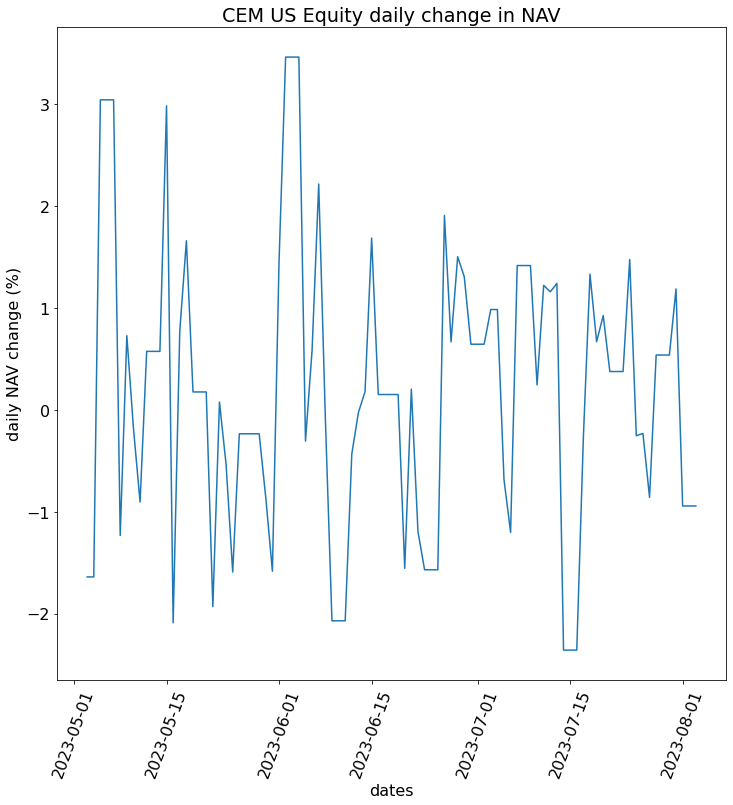

In [148]:
plt.figure(figsize=(WINDOW,WINDOW))
plt.plot(cef_pct_chg_df['DATE'], cef_pct_chg)
plt.xlabel('dates')
plt.tick_params(axis='x', rotation=70)
plt.ylabel('daily NAV change (%)')
plt.title(CEF_TCK + " daily change in NAV")
plt.show()

**get price change of each asset in CEF (put in mapping)**

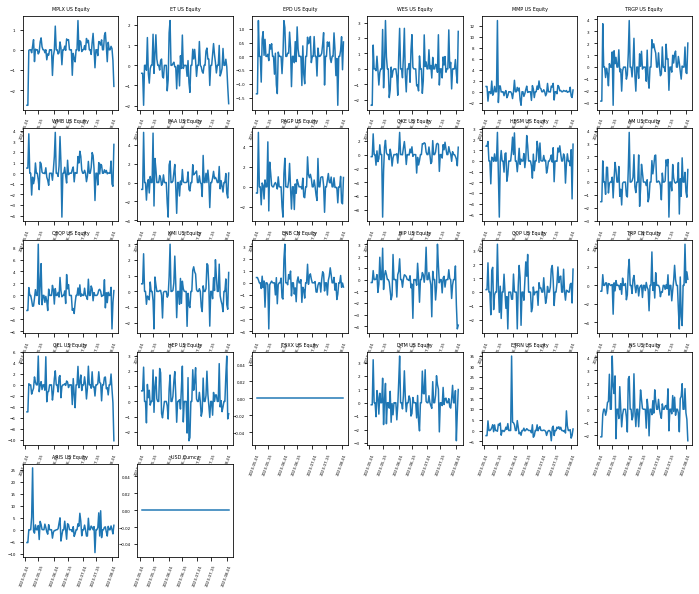

,CEM US Equity,MPLX US Equity,ET US Equity,EPD US Equity,WES US Equity,MMP US Equity,TRGP US Equity,WMB US Equity,PAA US Equity,PAGP US Equity,...,CQP US Equity,TRP CN Equity,GEL US Equity,HEP US Equity,JTSXX US Equity,DTM US Equity,ETRN US Equity,NS US Equity,ARIS US Equity,USD Curncy
0,-1.638911,-2.745995,-0.394945,-1.366120,-2.365258,0.965743,-2.857543,0.483425,-0.728155,-0.620636,...,0.178891,-0.628931,-4.942966,0.690955,0.0,-0.153745,-2.395210,-2.119461,-5.386740,0.0
1,-1.638911,-2.745995,-0.394945,-1.366120,-2.365258,0.965743,-2.857543,0.483425,-0.728155,-0.620636,...,0.178891,-0.628931,-4.942966,0.690955,0.0,-0.153745,-2.395210,-2.119461,-5.386740,0.0
2,3.041517,-0.029412,-1.982554,1.305896,1.548848,-1.714492,3.648161,3.711340,5.297474,5.386417,...,2.120536,1.157324,0.200000,2.245789,0.0,3.211615,4.498978,-0.393701,0.000000,0.0
3,3.041517,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.0
4,3.041517,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
88,0.538011,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.0
89,1.186603,0.169252,0.301887,0.226843,0.604982,0.821543,1.686717,1.145038,0.949796,1.030264,...,0.564642,4.441989,1.979167,1.668405,0.0,0.904977,0.387222,1.582815,1.579926,0.0
90,-0.942745,0.056322,-0.075245,0.716711,-0.318359,-0.784669,-0.463471,-1.015965,-1.142473,-1.529637,...,0.638916,0.275074,-0.817160,2.974359,0.0,-2.840060,-3.567985,-0.278242,0.091491,0.0
91,-0.942745,-0.534759,-1.054217,-0.486891,-0.922640,-1.049430,-0.539150,-1.231672,-1.631543,-1.682848,...,-0.788765,1.456003,-3.295572,-1.145418,0.0,-0.730769,-2.300000,-0.781250,-1.736746,0.0


In [149]:
chg_dict = all_changes(cef_list, {CEF_TCK: cef_pct_chg, }, correct_len, plot_data=True)
chg_df = pd.DataFrame(data=chg_dict)
chg_df

**build correlation matrix**

In [150]:
corr_df = corr_matrix(chg_df)
corr_df

,CEM US Equity,MPLX US Equity,ET US Equity,EPD US Equity,WES US Equity,MMP US Equity,TRGP US Equity,WMB US Equity,PAA US Equity,PAGP US Equity,...,CQP US Equity,TRP CN Equity,GEL US Equity,HEP US Equity,JTSXX US Equity,DTM US Equity,ETRN US Equity,NS US Equity,ARIS US Equity,USD Curncy
CEM US Equity,1.000000,0.466393,0.478789,0.536579,0.544801,0.411636,0.634347,0.520337,0.621558,0.631688,...,0.363977,0.313771,0.485738,0.488735,0.0,0.599949,0.028276,0.480335,0.313035,0.0
TRGP US Equity,0.634347,0.554224,0.400157,0.667132,0.589810,0.339645,1.000000,0.727640,0.734528,0.773499,...,0.394054,0.474077,0.416888,0.584904,0.0,0.698748,0.013286,0.394662,0.380000,0.0
PAGP US Equity,0.631688,0.342469,0.399233,0.584499,0.508678,0.532862,0.773499,0.669257,0.965467,1.000000,...,0.437979,0.403800,0.442972,0.587555,0.0,0.733301,-0.024438,0.441740,0.319608,0.0
PAA US Equity,0.621558,0.328320,0.403248,0.564145,0.563424,0.565643,0.734528,0.640790,1.000000,0.965467,...,0.465677,0.365096,0.427074,0.596180,0.0,0.671755,-0.041150,0.472685,0.299845,0.0
DTM US Equity,0.599949,0.373501,0.405097,0.496866,0.415752,0.385727,0.698748,0.734178,0.671755,0.733301,...,0.461414,0.283748,0.446929,0.520974,0.0,1.000000,0.039556,0.485662,0.356802,0.0
KMI US Equity,0.571048,0.298768,0.364815,0.626950,0.443777,0.234973,0.770300,0.812377,0.626577,0.692045,...,0.397358,0.440286,0.269782,0.602074,0.0,0.703891,0.036333,0.260053,0.297560,0.0
AM US Equity,0.570470,0.484287,0.454087,0.521055,0.608250,0.266792,0.709794,0.638670,0.576198,0.562644,...,0.342924,0.360040,0.308753,0.544431,0.0,0.689031,0.021479,0.423108,0.434510,0.0
WES US Equity,0.544801,0.422882,0.398557,0.516400,1.000000,0.404768,0.589810,0.473719,0.563424,0.508678,...,0.437384,0.202495,0.231316,0.359154,0.0,0.415752,0.006525,0.419431,0.370270,0.0
EPD US Equity,0.536579,0.533356,0.407065,1.000000,0.516400,0.198299,0.667132,0.521262,0.564145,0.584499,...,0.399537,0.311806,0.454667,0.536596,0.0,0.496866,0.066157,0.383424,0.367955,0.0
WMB US Equity,0.520337,0.235411,0.263729,0.521262,0.473719,0.205899,0.727640,1.000000,0.640790,0.669257,...,0.404518,0.348731,0.160868,0.524144,0.0,0.734178,0.036392,0.260862,0.245097,0.0


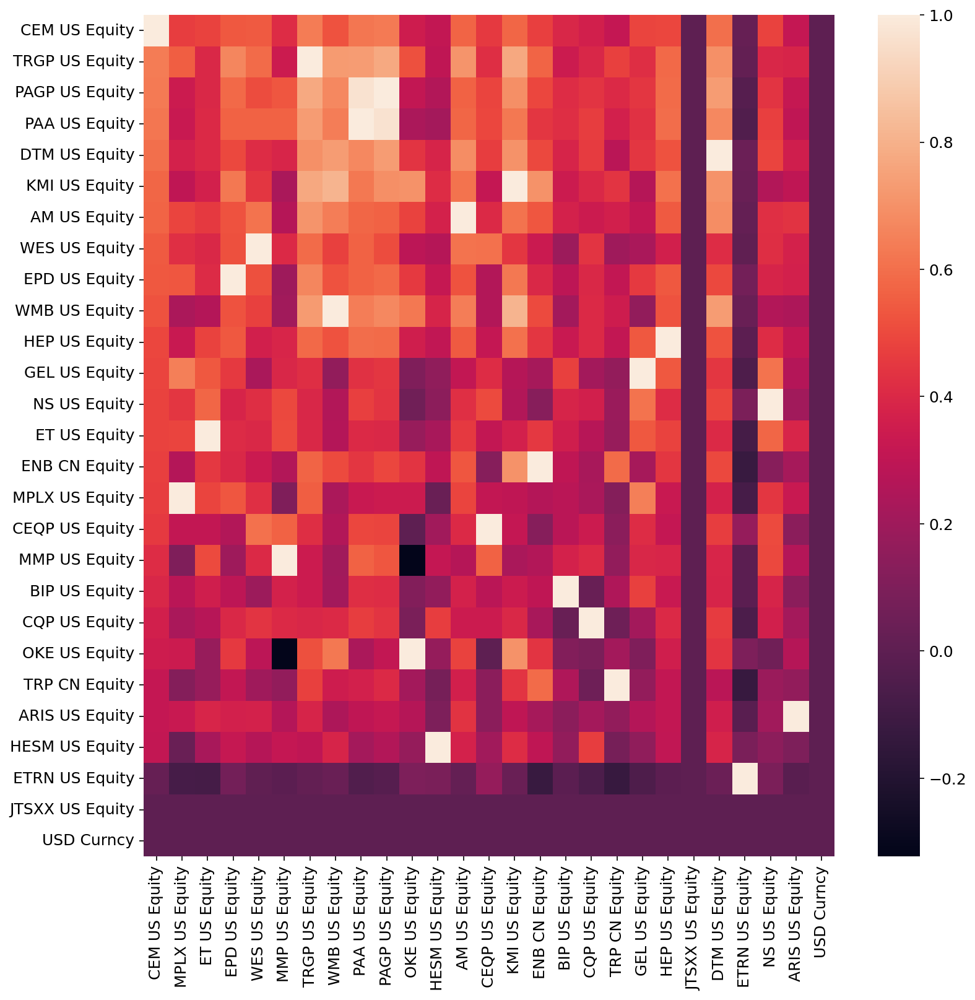

In [151]:
plt.figure(figsize=(WINDOW, WINDOW)).set_dpi(150)
sns.heatmap(corr_df)
plt.show()

**get {TOPNUM} correlations**

In [152]:
top_cef_as = get_top_corr(corr_df, TOPNUM)
top_cef_as

{'TRGP US Equity': 0.634347323271244,
 'PAGP US Equity': 0.6316877970042336,
 'PAA US Equity': 0.6215579708509641}

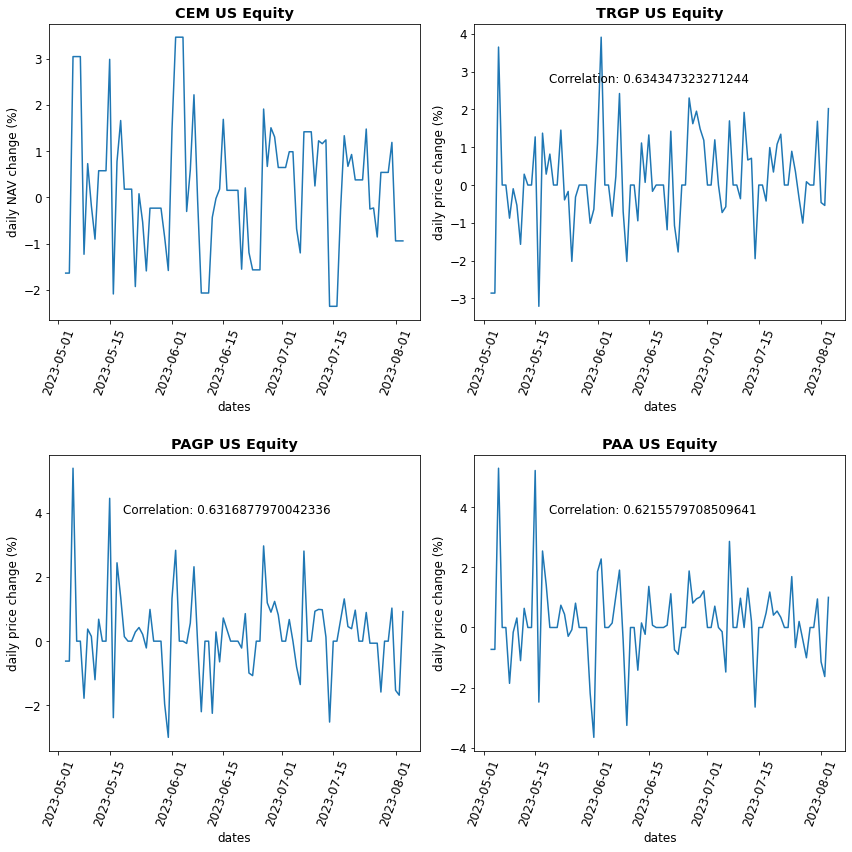

In [153]:
plt.figure(figsize=(WINDOW,WINDOW))
x = math.ceil((TOPNUM+1)**.5)
i=1
plt.subplot(x,x,i)
plt.plot(cef_pct_chg_df['DATE'], cef_pct_chg)
plt.xlabel('dates')
plt.tick_params(axis='x', rotation=70)
plt.ylabel('daily NAV change (%)')
plt.title(CEF_TCK, fontweight='bold')

for k in top_cef_as.keys():
    i+=1
    plt.subplot(x,x,i)
    plt.plot(cef_pct_chg_df['DATE'], chg_dict[k])
    plt.xlabel('dates')
    plt.tick_params(axis='x', rotation=70)
    plt.ylabel('daily price change (%)')
    plt.text(.2, .8, 'Correlation: ' + str(top_cef_as[k]),transform=plt.gca().transAxes)
    plt.title(k, fontweight='bold')
plt.tight_layout(h_pad=2)
plt.show()


# Run correlations outside CEF members

# Equities

**pull equities with liquidity $\geq$ $\$1$M avg traded value over 20-day period**

In [154]:
us_eq = bq.univ.filter(bq.univ.filter(bq.univ.equitiesuniv(['PRIMARY', 'ACTIVE']), bq.data.cntry_of_risk() == 'US'), 
                    bq.func.avg(bq.func.dropna(bq.data.turnover(dates=bq.func.range('-20d', '0d')))) >= 1000000)
us_eq_liq = bq.univ.filter(us_eq, bq.data.security_typ() == 'Common Stock')

eqlist = get_members(us_eq_liq)

ID
ESTE US Equity      ESTE US Equity
OSK US Equity        OSK US Equity
MTZ US Equity        MTZ US Equity
HLI US Equity        HLI US Equity
UTMD US Equity      UTMD US Equity
                        ...       
FTRE US Equity      FTRE US Equity
PHIN US Equity      PHIN US Equity
BGC US Equity        BGC US Equity
BATRA US Equity    BATRA US Equity
ESHA US Equity      ESHA US Equity
Name: ID().VALUE, Length: 2790, dtype: object


In [155]:
eq_chg_dict = all_changes(eqlist, {CEF_TCK: cef_pct_chg}, correct_len)

**get numpy list of % price changes for all equity tickers**

In [156]:
eq_df = pd.DataFrame(data=eq_chg_dict)
eq_df

,CEM US Equity,ESTE US Equity,OSK US Equity,MTZ US Equity,HLI US Equity,UTMD US Equity,ICAD US Equity,UFCS US Equity,UTL US Equity,GIII US Equity,...,GENK US Equity,TLNE US Equity,CAVA US Equity,SXTP US Equity,TSBX US Equity,FTRE US Equity,PHIN US Equity,BGC US Equity,BATRA US Equity,ESHA US Equity
0,-1.638911,-3.819174,-4.656518,-2.303307,-1.348109,-1.855626,1.408451,-0.953778,1.065751,-1.337793,...,-2.803129,0.000000,99.000000,-3.205128,-8.333333,0.000000,-16.189189,-9.799555,-0.685779,0.000000
1,-1.638911,-3.819174,-4.656518,-2.303307,-1.348109,-1.855626,1.408451,-0.953778,1.065751,-1.337793,...,-2.803129,0.000000,99.000000,-3.205128,-8.333333,0.000000,-16.189189,-9.799555,-0.685779,0.000000
2,3.041517,5.753647,1.932108,4.260037,1.111754,2.382514,-0.694444,1.592593,1.376229,6.372881,...,-2.803129,0.000000,99.000000,-3.205128,-8.333333,0.000000,-16.189189,2.962963,-0.685779,0.000000
3,3.041517,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,-2.803129,0.000000,99.000000,-3.205128,-8.333333,0.000000,-16.189189,0.000000,-0.685779,0.000000
4,3.041517,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,-2.803129,0.000000,99.000000,-3.205128,-8.333333,0.000000,-16.189189,0.000000,-0.685779,0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
88,0.538011,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
89,1.186603,0.313873,1.656178,0.623825,0.624811,2.533889,-5.782313,0.417711,-0.019212,0.242014,...,3.748048,0.000000,7.938008,6.161137,8.823529,0.724866,3.767374,-2.057613,3.588621,0.000000
90,-0.942745,0.187735,10.144455,3.566879,0.600901,-0.152548,-2.888087,-13.103161,-3.209070,0.917431,...,-0.652283,-0.276498,-0.210121,-4.017857,-1.081081,-3.598248,2.432147,-2.100840,-2.788340,0.000000
91,-0.942745,-3.685197,0.493048,0.106601,-0.905923,-2.108372,-2.973978,-0.382958,0.138972,-2.105263,...,-2.929293,-1.340111,-2.930339,-0.930233,-4.683841,-2.629017,2.821748,10.944206,1.455889,-0.069444


**get correlations between fund and each equity**

In [157]:
eq_corr_df = corr_matrix(eq_df)
eq_corr_df

,CEM US Equity,ESTE US Equity,OSK US Equity,MTZ US Equity,HLI US Equity,UTMD US Equity,ICAD US Equity,UFCS US Equity,UTL US Equity,GIII US Equity,...,GENK US Equity,TLNE US Equity,CAVA US Equity,SXTP US Equity,TSBX US Equity,FTRE US Equity,PHIN US Equity,BGC US Equity,BATRA US Equity,ESHA US Equity
CEM US Equity,1.000000,0.526643,0.358791,0.354513,0.275081,0.264641,0.160768,0.248312,0.282658,0.181286,...,0.159487,0.136116,0.061538,0.019070,0.000830,0.041705,-0.000689,0.328587,0.024712,-0.030473
TRGP US Equity,0.636092,0.805194,0.546177,0.465602,0.406642,0.423948,0.189587,0.343335,0.318677,0.197317,...,0.196152,0.234007,-0.130395,0.013868,0.046970,0.035108,0.075545,0.441940,0.066575,-0.046288
PAGP US Equity,0.631367,0.684667,0.352234,0.474108,0.434694,0.372392,0.178877,0.323996,0.224142,0.269946,...,0.113655,0.129802,0.002701,0.006851,-0.079078,0.071816,-0.081242,0.308676,-0.076302,0.022993
DTM US Equity,0.600715,0.604606,0.305222,0.423151,0.239975,0.413151,0.139590,0.422735,0.482907,0.233433,...,0.114269,0.179279,0.002089,0.007457,-0.022992,0.036196,-0.036545,0.267862,0.144053,0.059342
MRO US Equity,0.591944,0.858509,0.477968,0.306367,0.326383,0.282561,0.339623,0.379160,0.284025,0.254444,...,0.239069,0.183543,-0.036734,-0.028776,0.048092,-0.093077,0.064541,0.310020,0.053374,-0.047563
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
NVEC US Equity,-0.212928,-0.205281,-0.226725,-0.139116,-0.076444,-0.075796,0.008876,-0.196990,-0.072825,0.026784,...,-0.108301,-0.032000,0.133645,0.013220,-0.012080,0.049941,-0.154078,-0.441158,-0.068369,0.004878
AIMD US Equity,-0.234402,-0.240847,-0.112281,-0.141068,0.017150,0.251543,-0.090868,-0.031063,0.002747,-0.092772,...,0.055379,0.083835,-0.092953,-0.164049,-0.065384,-0.002776,0.152097,0.005644,-0.053552,-0.055691
CCCS US Equity,-0.239598,-0.392547,-0.235497,-0.082566,-0.143428,-0.205322,-0.166726,-0.183743,-0.326850,-0.208406,...,-0.104309,0.060350,0.158773,0.006558,0.013615,0.055237,-0.134174,-0.303802,0.084225,-0.016844
IMGN US Equity,-0.273688,-0.204570,-0.229816,-0.169031,-0.246980,-0.168464,-0.008012,-0.276843,-0.174427,-0.094164,...,-0.102256,0.032240,0.242925,0.018154,-0.190156,0.006336,-0.247508,-0.202700,-0.139186,0.142507


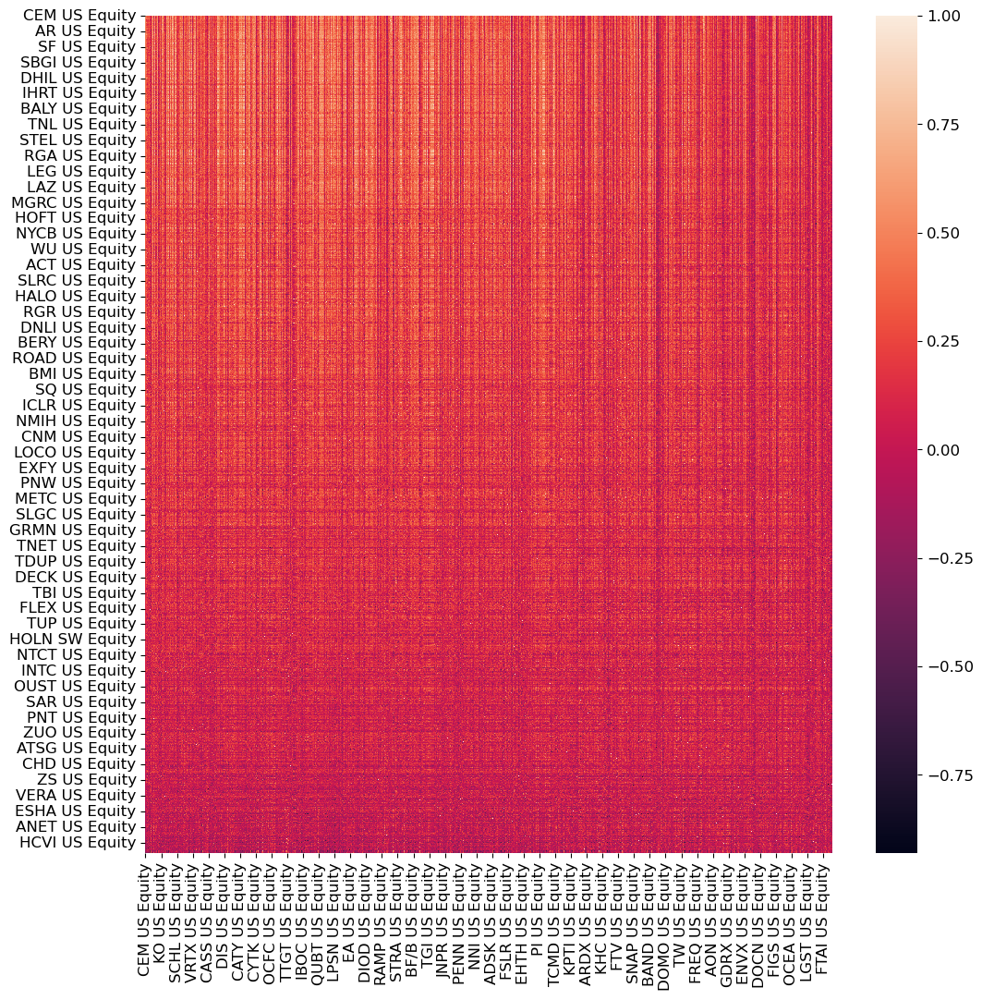

In [158]:
plt.figure(figsize=(WINDOW, WINDOW)).set_dpi(100)
sns.heatmap(eq_corr_df)
plt.show()

**get {TOPNUM} correlations**

In [159]:
top_eq = get_top_corr(eq_corr_df, TOPNUM)
top_eq

{'TRGP US Equity': 0.6360917726844821,
 'PAGP US Equity': 0.6313668713264826,
 'DTM US Equity': 0.600715231888353}

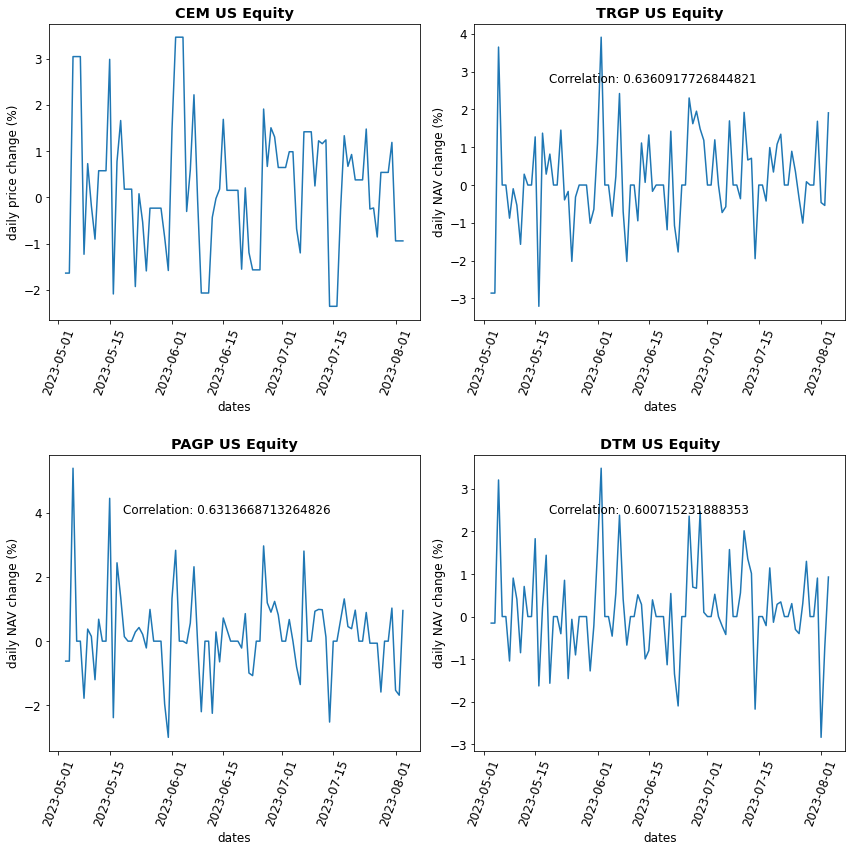

In [160]:
plt.figure(figsize=(WINDOW,WINDOW))
x = math.ceil((TOPNUM+1)**.5)
i=1
plt.subplot(x,x,i)
plt.plot(cef_pct_chg_df['DATE'], cef_pct_chg)
plt.xlabel('dates')
plt.tick_params(axis='x', rotation=70)
plt.ylabel('daily price change (%)')
plt.title(CEF_TCK, fontweight= 'bold')

for k in top_eq.keys():
    i+=1
    plt.subplot(x,x,i)
    plt.plot(cef_pct_chg_df['DATE'], eq_chg_dict[k])
    plt.xlabel('dates')
    plt.tick_params(axis='x', rotation=70)
    plt.ylabel('daily NAV change (%)')
    plt.text(.2, .8, 'Correlation: ' + str(top_eq[k]),transform=plt.gca().transAxes)
    plt.title(k, fontweight= 'bold')
plt.tight_layout(h_pad=2)
plt.show()


# ETFs

**pull ETFs with total assets value $\geq$ $\$150$M**

In [161]:
etf_univ_1=  bq.univ.filter(bq.univ.filter(bq.univ.fundsuniv(['active', 'primary']), bq.data.fund_typ() == 'ETF'), bq.func.between(bq.data.fund_total_assets()['value'],'150M','500M'))
etf_univ_2=  bq.univ.filter(bq.univ.filter(bq.univ.fundsuniv(['active', 'primary']), bq.data.fund_typ() == 'ETF'), bq.data.fund_total_assets() > '500M')

etfs1 = get_members(etf_univ_1)
etfs2 = get_members(etf_univ_2)

ID
510290 CH Equity      510290 CH Equity
ZPLA SW Equity          ZPLA SW Equity
XACBEAR SS Equity    XACBEAR SS Equity
MFE FP Equity            MFE FP Equity
WOOD US Equity          WOOD US Equity
                           ...        
JMHI US Equity          JMHI US Equity
2254 JP Equity          2254 JP Equity
2253 JP Equity          2253 JP Equity
AIPE GR Equity          AIPE GR Equity
MWOP GR Equity          MWOP GR Equity
Name: ID().VALUE, Length: 1718, dtype: object
ID
RGNIFTY IN Equity    RGNIFTY IN Equity
VHT US Equity            VHT US Equity
EWS US Equity            EWS US Equity
SMSWLD GR Equity      SMSWLD GR Equity
510050 CH Equity      510050 CH Equity
                           ...        
463250 KS Equity      463250 KS Equity
464060 KS Equity      464060 KS Equity
463680 KS Equity      463680 KS Equity
463640 KS Equity      463640 KS Equity
463690 KS Equity      463690 KS Equity
Name: ID().VALUE, Length: 3525, dtype: object


In [162]:
etf1_chg_dict = all_changes(etfs1, {}, correct_len)
etf2_chg_dict = all_changes(etfs2, {}, correct_len)

**get numpy list of % price changes for all ETFs**

In [163]:
etf2_chg_dict[CEF_TCK] = cef_pct_chg

etf2_chg_dict.update(etf1_chg_dict)
etf_df = pd.DataFrame(data=etf2_chg_dict)
etf_df

,RGNIFTY IN Equity,VHT US Equity,EWS US Equity,SMSWLD GR Equity,510050 CH Equity,LICMFGLD IN Equity,CLG CN Equity,XGD CN Equity,ILCG US Equity,VOE US Equity,...,HSGG LN Equity,GJUN US Equity,HCMT US Equity,JPEF US Equity,JMSI US Equity,JMHI US Equity,2254 JP Equity,2253 JP Equity,AIPE GR Equity,MWOP GR Equity
0,0.000000,-0.744296,0.610998,-0.113724,0.559701,1.197503,0.000000,2.109300,-0.472126,-1.052791,...,-0.195117,-0.301306,-1.593065,-1.592561,0.064457,0.108840,-0.502513,-0.500501,-0.207162,0.154847
1,0.000000,-0.744296,0.610998,-0.113724,0.559701,1.197503,0.000000,2.109300,-0.472126,-1.052791,...,-0.195117,-0.301306,-1.593065,-1.592561,0.064457,0.108840,-0.502513,-0.500501,-0.207162,0.154847
2,0.000000,1.049008,1.417004,1.798100,-0.296846,0.125679,-0.527550,-1.924883,2.098157,1.890692,...,-0.195117,-0.301306,-1.593065,-1.592561,0.064457,0.108840,-0.502513,-0.500501,-0.207162,1.499691
3,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,-0.195117,-0.301306,-1.593065,-1.592561,0.064457,0.108840,-0.502513,-0.500501,-0.207162,0.000000
4,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,-0.195117,-0.301306,-1.593065,-1.592561,0.064457,0.108840,-0.502513,-0.500501,-0.207162,0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
88,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,-1.592561,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
89,0.229885,-0.618772,0.753390,0.339520,0.146681,0.184427,0.121655,1.357466,0.250548,0.356494,...,-0.079507,-0.080328,0.017158,-1.592561,-0.219736,-0.581770,4.536082,2.257115,0.098600,-0.069813
90,-3.963303,-0.570065,-0.797607,-0.345446,-0.292933,0.016568,-0.425273,-2.790179,-0.283974,-0.445776,...,-0.338174,0.163399,-0.281781,-1.592561,-0.364364,-0.271435,-0.887574,1.151631,-0.197006,-0.097806
91,3.331582,-0.134185,-2.713568,-1.161786,-0.918105,0.084666,0.061013,-2.468427,-1.944447,-0.489750,...,-0.154691,-1.011419,-3.696925,-1.592561,-0.136634,-0.263852,-0.099502,-0.664137,0.138176,-0.685315


**build correlation matrix of each ETF with the Fund**

In [164]:
etf_corr_df = corr_matrix(etf_df)
etf_corr_df

,RGNIFTY IN Equity,VHT US Equity,EWS US Equity,SMSWLD GR Equity,510050 CH Equity,LICMFGLD IN Equity,CLG CN Equity,XGD CN Equity,ILCG US Equity,VOE US Equity,...,HSGG LN Equity,GJUN US Equity,HCMT US Equity,JPEF US Equity,JMSI US Equity,JMHI US Equity,2254 JP Equity,2253 JP Equity,AIPE GR Equity,MWOP GR Equity
CEM US Equity,0.083792,0.208550,0.296160,0.333057,0.132225,0.001288,-0.048609,0.111853,0.199816,0.598787,...,0.075271,0.123568,0.090654,-0.084166,0.051667,0.021335,-0.023437,-0.014592,0.078478,0.229300
AMLP US Equity,0.038945,0.139097,0.357636,0.309988,0.267701,0.017473,-0.162017,0.117613,0.234150,0.635834,...,0.109595,0.198869,0.160630,0.026879,-0.033962,-0.035092,0.022089,0.047808,0.103304,0.195806
UMI US Equity,0.038236,0.314359,0.440641,0.378512,0.214367,0.056325,0.010575,0.267550,0.212619,0.762834,...,0.153332,0.238234,0.213247,0.128833,-0.054787,-0.073715,0.037215,0.059149,0.031445,0.190132
EMLP US Equity,0.069979,0.354902,0.443048,0.378176,0.177185,0.049496,0.026862,0.282063,0.205324,0.788564,...,0.184960,0.205447,0.145424,-0.053623,0.125167,0.043053,0.033312,0.079467,-0.013807,0.273732
MLPX US Equity,0.016041,0.249991,0.385350,0.375965,0.204036,0.050487,0.005910,0.228674,0.186646,0.764026,...,0.119739,0.232857,0.175767,0.141890,-0.080168,-0.104100,0.063670,0.103100,-0.007865,0.184286
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
DOG US Equity,0.046869,-0.628637,-0.446894,-0.693448,-0.253647,0.110513,0.000692,-0.118990,-0.613039,-0.837901,...,-0.128752,-0.352651,-0.266730,0.008200,-0.025752,-0.027414,0.021346,-0.060912,-0.084905,-0.557873
SDOW US Equity,0.041963,-0.644377,-0.441290,-0.724864,-0.279470,0.069495,0.000030,-0.130151,-0.637199,-0.841417,...,-0.134702,-0.364895,-0.276065,0.011255,-0.025396,-0.024112,0.024206,-0.061154,-0.087523,-0.597327
RWM US Equity,-0.007216,-0.329385,-0.462834,-0.571354,-0.240911,-0.070921,-0.005056,-0.156256,-0.508773,-0.870966,...,-0.129139,-0.320603,-0.279442,0.024409,-0.093591,-0.138184,0.019517,0.033538,-0.077139,-0.404961
SRTY US Equity,-0.010044,-0.330041,-0.467673,-0.582562,-0.259832,-0.081843,-0.008179,-0.174314,-0.519777,-0.871110,...,-0.137367,-0.327579,-0.287684,0.022869,-0.101254,-0.136005,0.011540,0.024146,-0.058318,-0.419987


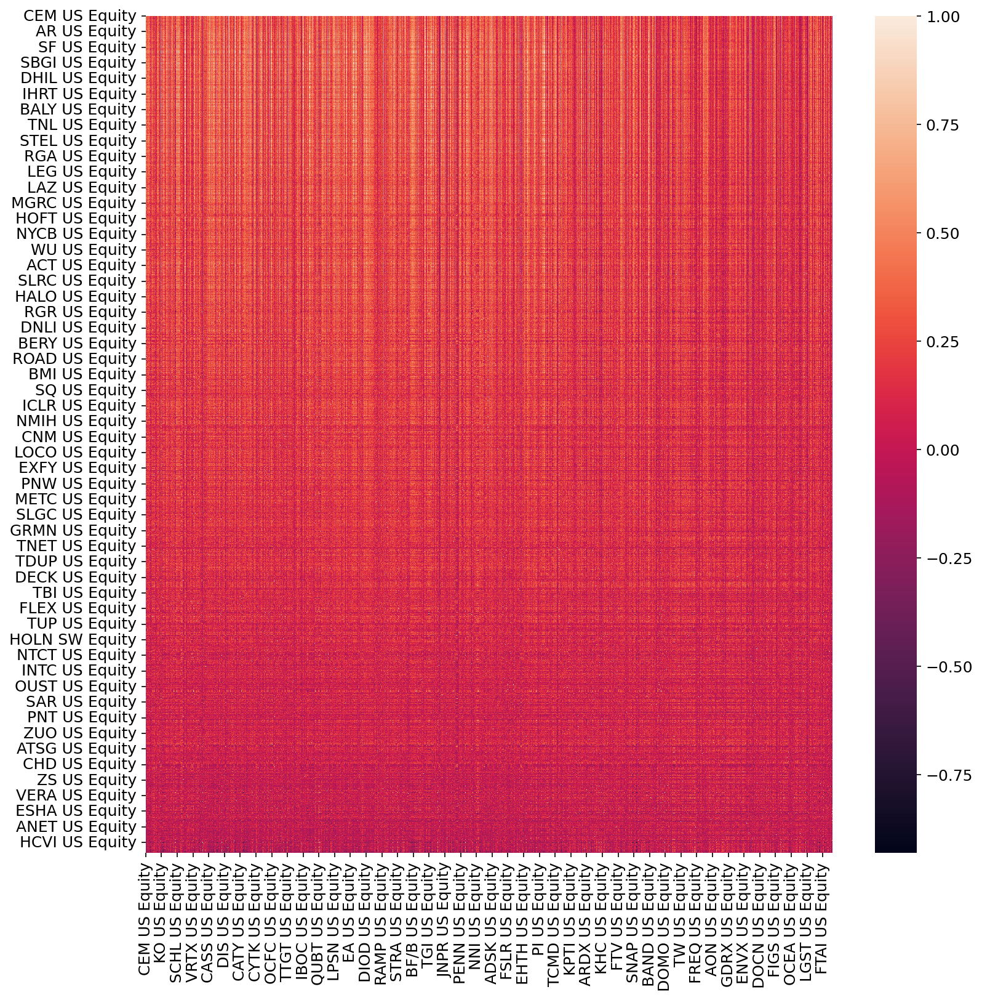

In [165]:
plt.figure(figsize=(WINDOW, WINDOW)).set_dpi(150)
sns.heatmap(eq_corr_df)
plt.show()

**get {TOPNUM} correlations**

In [166]:
top_etfs = get_top_corr(etf_corr_df, TOPNUM)
top_etfs

{'AMLP US Equity': 0.03894483396128106,
 'UMI US Equity': 0.038236360709446644,
 'EMLP US Equity': 0.06997930232268738}

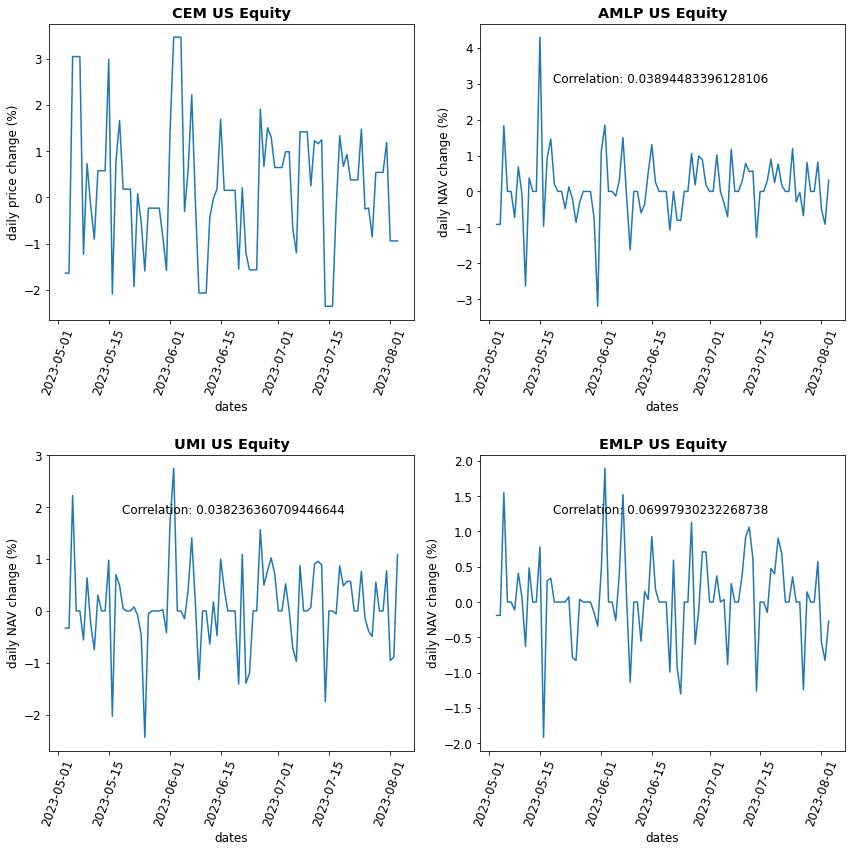

In [167]:
plt.figure(figsize=(WINDOW,WINDOW))
x = math.ceil((TOPNUM+1)**.5)
i=1
plt.subplot(x,x,i)
plt.plot(cef_pct_chg_df['DATE'], cef_pct_chg)
plt.xlabel('dates')
plt.tick_params(axis='x', rotation=70)
plt.ylabel('daily price change (%)')
plt.title(CEF_TCK, fontweight= "bold")

for k in top_etfs.keys():
    i+=1
    plt.subplot(x,x,i)
    plt.plot(cef_pct_chg_df['DATE'], etf2_chg_dict[k])
    plt.xlabel('dates')
    plt.tick_params(axis='x', rotation=70)
    plt.ylabel('daily NAV change (%)')
    plt.text(.2, .8, 'Correlation: ' + str(top_etfs[k]),transform=plt.gca().transAxes)
    plt.title(k, fontweight = "bold")
plt.tight_layout(h_pad=2)
plt.show()


# Running Linear Regression

**Combine top tickers from each dataset, find overall {TOPNUM} correlations**

In [168]:
alltop = [(k,v, chg_dict) for k, v in top_cef_as.items()]
eqs = [(k,v, eq_chg_dict) for k, v in top_eq.items()]
etf = [(k,v, etf2_chg_dict) for k, v in top_etfs.items()]
alltop.extend(eqs)
alltop.extend(etf)

sortedtop = [tup for tup in sorted(alltop, key=lambda item: item[1], reverse=True)]
[(tup[0], tup[1]) for tup in sorted(alltop, key=lambda item: item[1], reverse=True)]

[('TRGP US Equity', 0.6360917726844821),
 ('TRGP US Equity', 0.634347323271244),
 ('PAGP US Equity', 0.6316877970042336),
 ('PAGP US Equity', 0.6313668713264826),
 ('PAA US Equity', 0.6215579708509641),
 ('DTM US Equity', 0.600715231888353),
 ('EMLP US Equity', 0.06997930232268738),
 ('AMLP US Equity', 0.03894483396128106),
 ('UMI US Equity', 0.038236360709446644)]

**build X, Y matrices for linear regression**

In [169]:
X = get_data(sortedtop[0]) # (n,)
n = X.shape[0]
seen = [sortedtop[0][0]]

i=1
for tup in sortedtop:
    if tup[0] in seen:
        continue
    else:
        i+=1
        X = np.vstack((X, get_data(tup))) # (d, n)
        seen.append(tup[0])
        if i == TOPNUM:
            break

Y = np.resize(cef_pct_chg, (n, 1)) #nx1

X, Y

(array([[-2.85754307, -2.85754307,  3.6481615 ,  0.        ,  0.        ,
         -0.87646077, -0.09824561, -0.53385783, -1.56779661,  0.28698522,
          0.        ,  0.        ,  1.27342968, -3.20712066,  1.37206247,
          0.28797696,  0.8183776 ,  0.        ,  0.        ,  1.45257761,
         -0.39303762, -0.16910936, -2.01863354, -0.31695721,  0.        ,
          0.        ,  0.        , -1.01170689, -0.64242955,  1.10213079,
          3.90988372,  0.        ,  0.        , -0.82529025,  0.22566996,
          2.42048973, -0.70074196, -2.02020202,  0.        ,  0.        ,
         -0.94619404,  1.11206159,  0.07050197,  1.32450331, -0.16687526,
          0.        ,  0.        ,  0.        , -1.18400891,  1.42373837,
         -1.07018763, -1.77016016,  0.        ,  0.        ,  2.30263158,
          1.62169719,  1.95350117,  1.48428012,  1.18335328,  0.        ,
          0.        ,  1.19579501,  0.        , -0.72717829, -0.57553957,
          1.69714511,  0.        ,  0.

**run cross-validation error for each hyperparameter value**

0 1.154743443826917
1e-05 1.154744165875065
0.0001 1.154750713915363
0.001 1.1548210190597907
0.002 1.154909070878557
0.01 1.1559336325941392
0.02 1.157816219908721
0.03 1.160153076857585
0.1 1.1820264200385737
0.2 1.2183697022610334
0.3 1.2559147265394288
0.7 1.4029396248644015
1 1.5060628220508774
1.5 1.663160568023184
3 2.0399467320795646


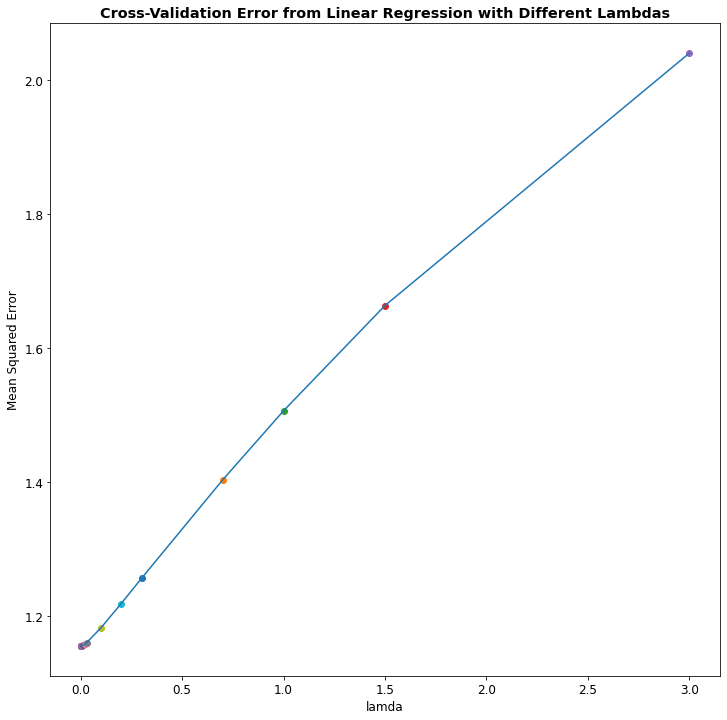

In [170]:
min = float("inf")
plt.figure(figsize=(WINDOW, WINDOW))
errors = []
coeff = []
for lam in lams:
    th, th_0 = lin_reg(X, Y, lam)
    coeff.append((th, th_0))
    err = cross_validate(X, Y, n_splits, lam, lin_reg, mse)
    print(lam, err)
    errors.append(err)
    plt.scatter(lam, err)
    
plt.title("Cross-Validation Error from Linear Regression with Different Lambdas", fontweight="bold")
plt.xlabel("lamda")
plt.ylabel("Mean Squared Error")
plt.plot(lams, errors)
plt.show()

**get optimal lambda, coefficients**

In [171]:
minerr, minlam, optths = float('inf'), None, None
for lam, err, ths in zip(lams, errors, coeff):
    if err < minerr:
        minerr, minlam, optths = err, lam, ths
th, th_0 = optths
print("optimal lamda:", minlam)
print("minimum testing error:", minerr)
print("linear regression coefficients: \n", th, '\n', th_0)

optimal lamda: 0
minimum testing error: 1.154743443826917
linear regression coefficients: 
 [[0.43466563]
 [0.11905233]
 [0.25335531]] 
 0.06240416780783678


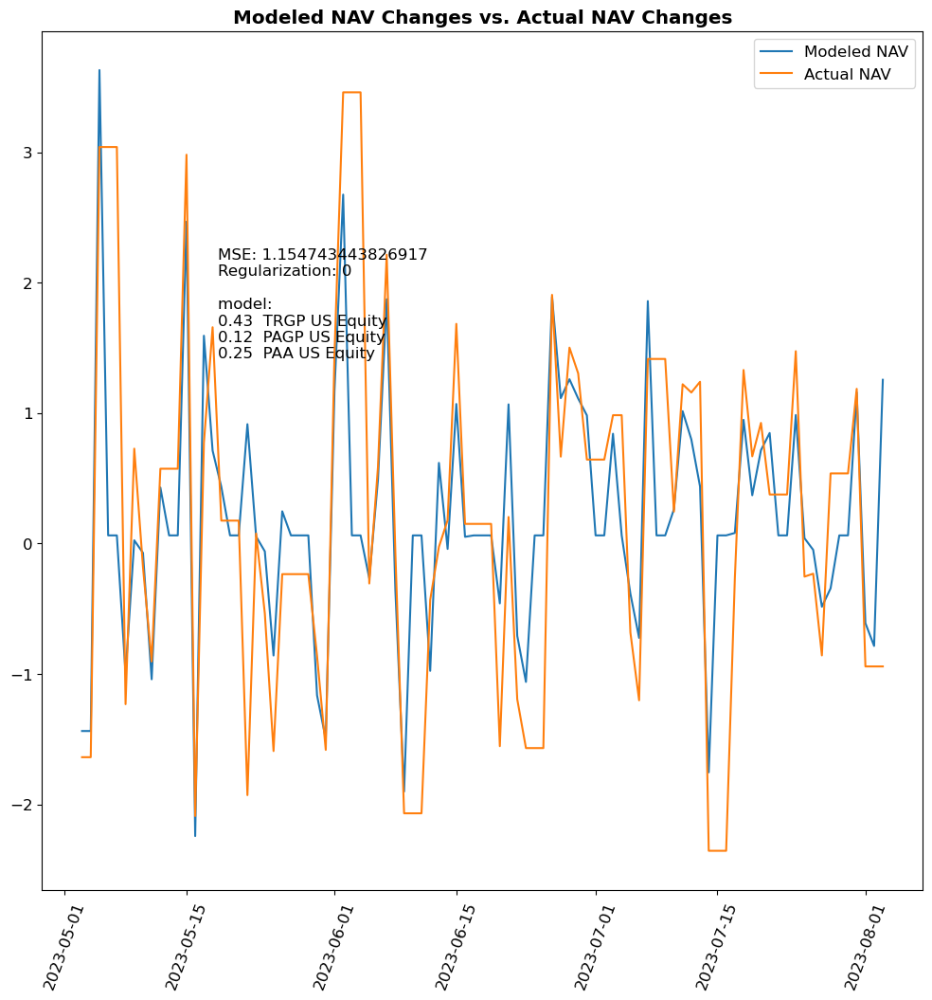

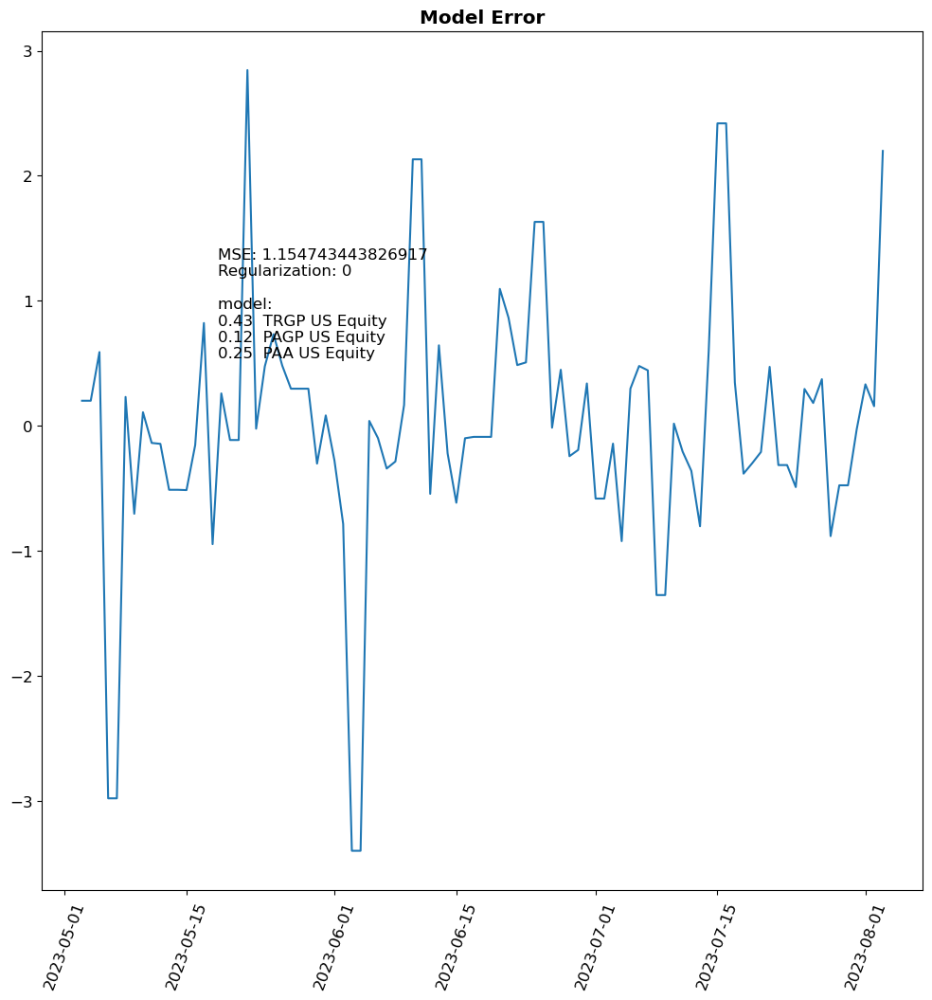

In [172]:
Y_hat = th.T@X + th_0
model = ''
for i in range(TOPNUM):
    model += str(round(th[i][0],2)) + '  ' + seen[i] + '\n'

plt.figure(figsize=(WINDOW, WINDOW)).set_dpi(100)
plt.title("Modeled NAV Changes vs. Actual NAV Changes", fontweight="bold")
plt.text(.2, .6, 'MSE: ' + str(minerr) + '\nRegularization: '+ str(minlam) + '\n \nmodel: \n' + model,transform=plt.gca().transAxes)
plt.plot(cef_pct_chg_df['DATE'], Y_hat.T, label = 'Modeled NAV')
plt.plot(cef_pct_chg_df['DATE'], Y, label = 'Actual NAV')
plt.legend()
plt.tick_params(axis='x', rotation=70)
plt.show()


plt.figure(figsize=(WINDOW, WINDOW)).set_dpi(100)
plt.title("Model Error", fontweight="bold")
plt.text(.2, .6, 'MSE: ' + str(minerr) + '\nRegularization: '+ str(minlam) + '\n \nmodel: \n' + model,transform=plt.gca().transAxes)
e = Y_hat.T-Y
plt.tick_params(axis='x', rotation=70)
plt.plot(cef_pct_chg_df['DATE'], e)
plt.show()

# Comparing model's error to manual-hedge error

In [173]:
Y_manual = etf2_chg_dict['XBI US Equity']*.5 + etf2_chg_dict['IBB US Equity']*.5
Y_manual = np.resize(Y_manual, (n,1))
err_manual = np.mean((Y_manual-Y)**2)
err_manual

2.128341281899678

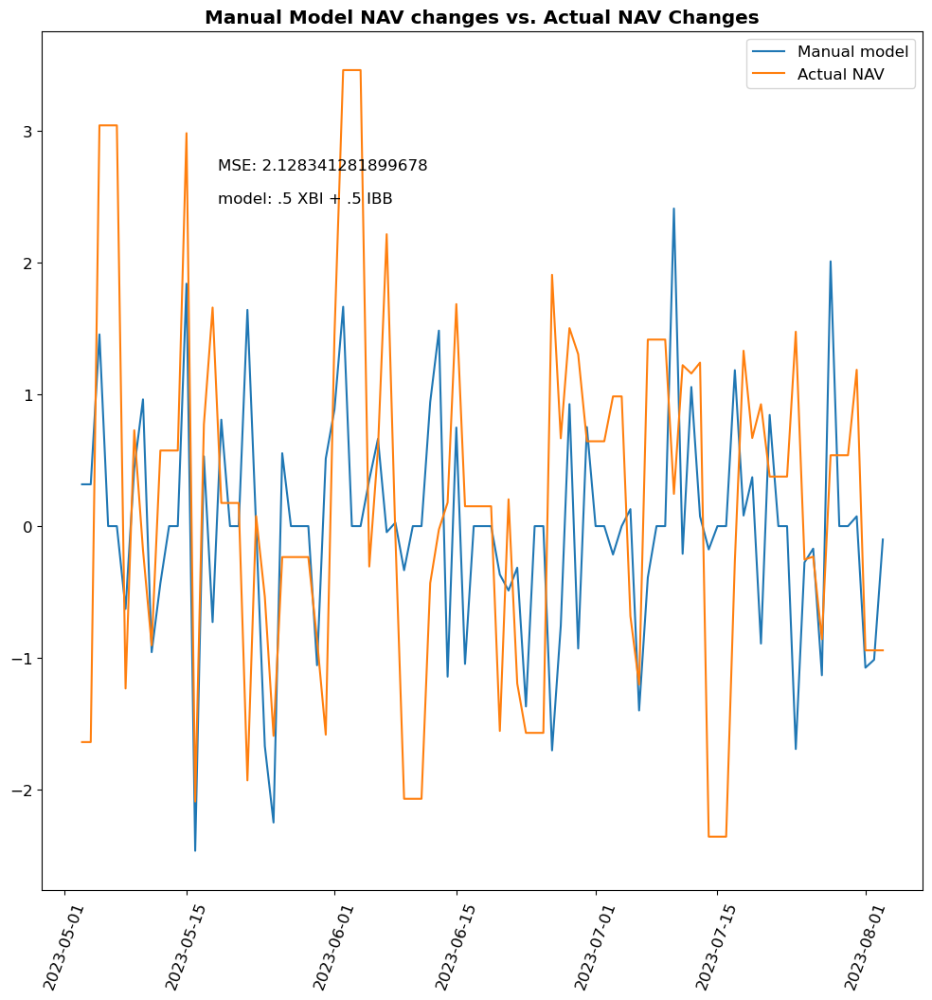

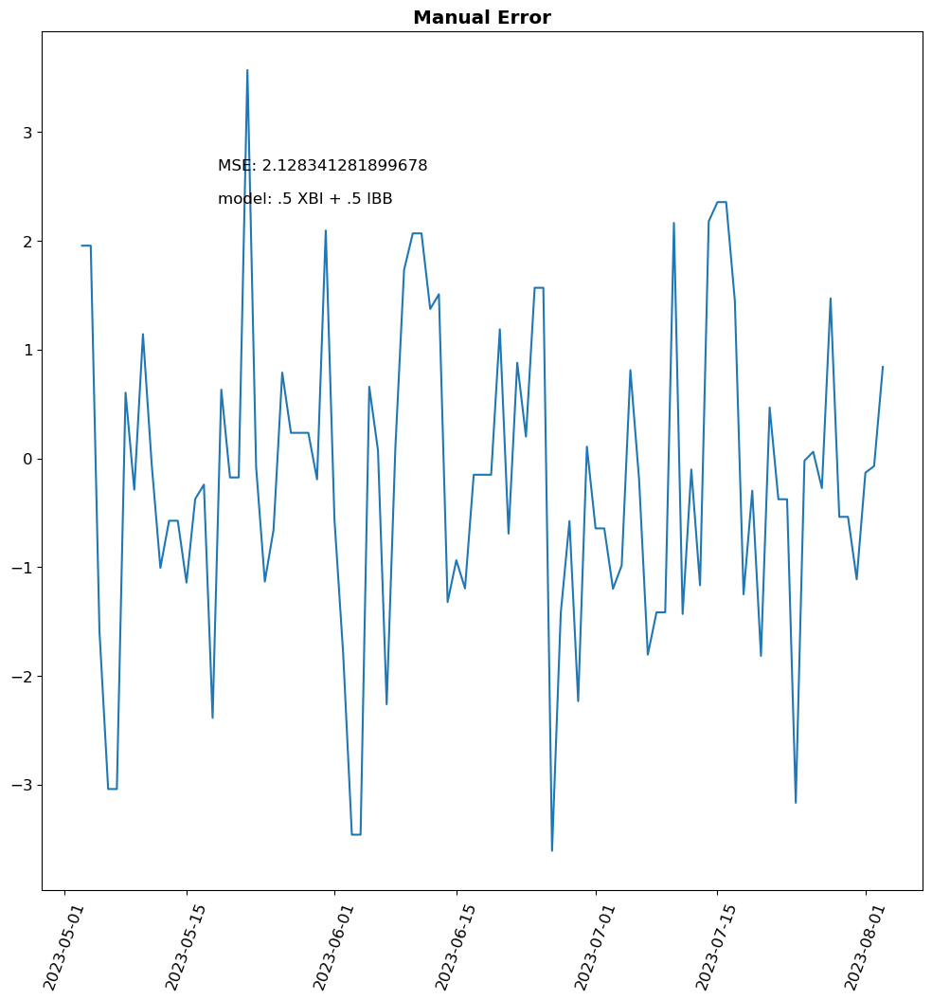

In [174]:
plt.figure(figsize=(WINDOW, WINDOW)).set_dpi(100)
plt.title("Manual Model NAV changes vs. Actual NAV Changes", fontweight="bold")
plt.text(.2, .8, 'MSE: ' + str(err_manual) + '\n \nmodel: .5 XBI + .5 IBB',transform=plt.gca().transAxes)
plt.plot(cef_pct_chg_df['DATE'], Y_manual, label = 'Manual model')
plt.plot(cef_pct_chg_df['DATE'], Y, label = 'Actual NAV')
plt.tick_params(axis='x', rotation=70)
plt.legend()
plt.show()


plt.figure(figsize=(WINDOW, WINDOW)).set_dpi(100)
plt.title("Manual Error", fontweight="bold")
plt.text(.2, .8, 'MSE: ' + str(err_manual) + '\n \nmodel: .5 XBI + .5 IBB',transform=plt.gca().transAxes)
em = Y_manual-Y
plt.plot(cef_pct_chg_df['DATE'], em)
plt.tick_params(axis='x', rotation=70)
plt.show()

In [175]:

universe = bq.univ.filter(bq.univ.equitiesuniv('active'), bq.data.security_typ() == "Common Stock")
data_item = bq.data.id()

# request = bql.Request(universe, data_item)
# response = bq.execute(request)

# data = response[0].df()
# data.head()